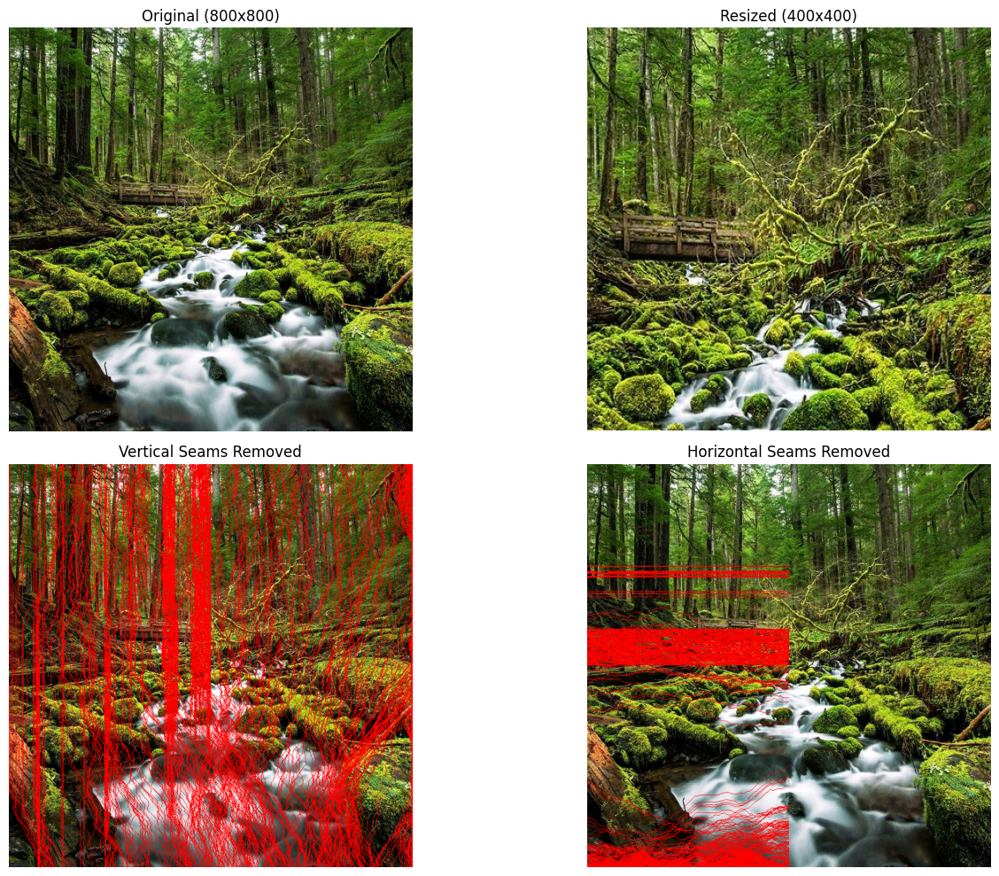

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

class SeamCarver:
    def __init__(self, filename, out_height, out_width):
        # initialize parameter
        self.filename = filename
        self.out_height = out_height
        self.out_width = out_width

        # read in image and store as np.float64 format
        self.in_image = cv2.imread(filename).astype(np.float64)
        self.in_height, self.in_width = self.in_image.shape[: 2]

        # keep tracking resulting image
        self.out_image = np.copy(self.in_image)

        # kernel for forward energy map calculation
        self.kernel_x = np.array([[0., 0., 0.], [-1., 0., 1.], [0., 0., 0.]], dtype=np.float64)
        self.kernel_y_left = np.array([[0., 0., 0.], [0., 0., 1.], [0., -1., 0.]], dtype=np.float64)
        self.kernel_y_right = np.array([[0., 0., 0.], [1., 0., 0.], [0., -1., 0.]], dtype=np.float64)

        # constant for covered area by protect mask or object mask
        self.constant = 1000

        # Store seams for visualization
        self.vertical_seams = []
        self.horizontal_seams = []

        # starting program
        self.seams_carving()

    def seams_carving(self):
        """
        :return:

        We first process seam insertion or removal in vertical direction then followed by horizontal direction.

        If targeting height or width is greater than original ones --> seam insertion,
        else --> seam removal

        The algorithm is written for seam processing in vertical direction (column), so image is rotated 90 degree
        counter-clockwise for seam processing in horizontal direction (row)
        """
        # calculate number of rows and columns needed to be inserted or removed
        delta_row, delta_col = int(self.out_height - self.in_height), int(self.out_width - self.in_width)

        # remove column
        if delta_col < 0:
            self.seams_removal(delta_col * -1, vertical=True)

        # remove row
        if delta_row < 0:
            self.out_image = self.rotate_image(self.out_image, 1)
            self.seams_removal(delta_row * -1, vertical=False)
            self.out_image = self.rotate_image(self.out_image, 0)

    def seams_removal(self, num_pixel, vertical=True):
        """Remove num_pixel seams from the image"""
        # Store original dimensions to map seams back to original image space
        original_height, original_width = self.in_image.shape[:2]

        # Keep track of cumulative removed pixels to adjust coordinates
        removed_pixels = np.zeros((self.out_image.shape[0],), dtype=np.int32)

        for _ in range(num_pixel):
            energy_map = self.calc_energy_map()
            cumulative_map = self.cumulative_map_forward(energy_map)
            seam_idx = self.find_seam(cumulative_map)

            # Map seam back to original image coordinates before storing
            if vertical:
                # Adjust for already removed columns
                original_seam = np.copy(seam_idx)
                for i in range(len(original_seam)):
                    original_seam[i] += removed_pixels[i]
                self.vertical_seams.append(original_seam)

                # Update removed pixels tracker
                for i in range(len(seam_idx)):
                    removed_pixels[i] += 1
            else:
                # For horizontal, similar approach but track removed rows
                original_seam = np.copy(seam_idx)
                for i in range(len(original_seam)):
                    original_seam[i] += removed_pixels[i]
                self.horizontal_seams.append(original_seam)

                # Update removed pixels tracker
                for i in range(len(seam_idx)):
                    removed_pixels[i] += 1

            self.delete_seam(seam_idx)

    def calc_energy_map(self):
        """Calculate energy map using gradient magnitude"""
        # Convert to grayscale for energy calculation
        if self.out_image.shape[2] == 3:
            gray = cv2.cvtColor(self.out_image.astype(np.uint8), cv2.COLOR_BGR2GRAY).astype(np.float64)
        else:
            gray = self.out_image[:, :, 0]  # Just use one channel if already grayscale

        # Compute gradients manually
        def compute_gradient(channel):
            dx = np.zeros_like(channel, dtype=np.float64)
            dy = np.zeros_like(channel, dtype=np.float64)

            # Compute ∂I/∂x (horizontal gradient)
            dx[:, 1:-1] = channel[:, 2:] - channel[:, :-2]  # Central difference for interior pixels
            dx[:, 0] = channel[:, 1] - channel[:, 0]        # Forward difference for left edge
            dx[:, -1] = channel[:, -1] - channel[:, -2]     # Backward difference for right edge

            # Compute ∂I/∂y (vertical gradient)
            dy[1:-1, :] = channel[2:, :] - channel[:-2, :]  # Central difference for interior pixels
            dy[0, :] = channel[1, :] - channel[0, :]        # Forward difference for top edge
            dy[-1, :] = channel[-1, :] - channel[-2, :]     # Backward difference for bottom edge

            # Compute energy as |∂I/∂x| + |∂I/∂y|
            return np.abs(dx) + np.abs(dy)

        # Compute energy map for the grayscale image
        energy_map = compute_gradient(gray)
        return energy_map

    def cumulative_map_forward(self, energy_map):
        """Compute the cumulative energy map using forward energy calculation"""
        matrix_x = self.calc_neighbor_matrix(self.kernel_x)
        matrix_y_left = self.calc_neighbor_matrix(self.kernel_y_left)
        matrix_y_right = self.calc_neighbor_matrix(self.kernel_y_right)

        m, n = energy_map.shape
        output = np.copy(energy_map)
        for row in range(1, m):
            for col in range(n):
                if col == 0:
                    e_right = output[row - 1, col + 1] + matrix_x[row - 1, col + 1] + matrix_y_right[row - 1, col + 1]
                    e_up = output[row - 1, col] + matrix_x[row - 1, col]
                    output[row, col] = energy_map[row, col] + min(e_right, e_up)
                elif col == n - 1:
                    e_left = output[row - 1, col - 1] + matrix_x[row - 1, col - 1] + matrix_y_left[row - 1, col - 1]
                    e_up = output[row - 1, col] + matrix_x[row - 1, col]
                    output[row, col] = energy_map[row, col] + min(e_left, e_up)
                else:
                    e_left = output[row - 1, col - 1] + matrix_x[row - 1, col - 1] + matrix_y_left[row - 1, col - 1]
                    e_right = output[row - 1, col + 1] + matrix_x[row - 1, col + 1] + matrix_y_right[row - 1, col + 1]
                    e_up = output[row - 1, col] + matrix_x[row - 1, col]
                    output[row, col] = energy_map[row, col] + min(e_left, e_right, e_up)
        return output

    def calc_neighbor_matrix(self, kernel):
        """Apply kernel to each color channel and sum results"""
        if self.out_image.shape[2] == 3:
            b, g, r = cv2.split(self.out_image)
            output = np.absolute(cv2.filter2D(b, -1, kernel=kernel)) + \
                    np.absolute(cv2.filter2D(g, -1, kernel=kernel)) + \
                    np.absolute(cv2.filter2D(r, -1, kernel=kernel))
        else:
            output = np.absolute(cv2.filter2D(self.out_image[:, :, 0], -1, kernel=kernel))

        return output

    def find_seam(self, cumulative_map):
        """Find the optimal seam based on the cumulative energy map"""
        m, n = cumulative_map.shape
        output = np.zeros((m,), dtype=np.int32)

        # Find the minimum energy path in the last row
        output[-1] = np.argmin(cumulative_map[-1])

        # Backtrack to find the complete seam path
        for row in range(m - 2, -1, -1):
            prev_col = output[row + 1]

            # Handle boundary conditions properly
            if prev_col == 0:
                offset = 0
                cols = [0, 1]
            elif prev_col == n - 1:
                offset = prev_col - 1
                cols = [n - 2, n - 1]
            else:
                offset = prev_col - 1
                cols = [prev_col - 1, prev_col, prev_col + 1]

            # Find min energy from the allowed neighbors
            output[row] = offset + np.argmin(cumulative_map[row, cols])

        return output

    def delete_seam(self, seam_idx):
        """Delete a seam from the image"""
        m, n, c = self.out_image.shape
        output = np.zeros((m, n - 1, c), dtype=self.out_image.dtype)

        for row in range(m):
            col = seam_idx[row]
            for channel in range(c):
                # Copy all pixels except the seam
                output[row, :col, channel] = self.out_image[row, :col, channel]
                output[row, col:, channel] = self.out_image[row, col+1:, channel]

        self.out_image = output

    def rotate_image(self, image, ccw):
        """Rotate the image 90 degrees clockwise or counter-clockwise"""
        if ccw:
            return np.rot90(image)
        else:
            return np.rot90(image, k=-1)

    def save_result(self, filename):
        """Save the resulting image"""
        cv2.imwrite(filename, self.out_image.astype(np.uint8))

    def visualize_seams(self, output_path=None, seam_color=[0, 0, 255], show_vertical=True, show_horizontal=True, max_seams=None):
        """
        Visualizes the seams that were removed during the seam carving process.
        """
        # Read the original image for visualization
        orig_image = cv2.imread(self.filename)
        if orig_image is None:
            raise ValueError(f"Could not read image at {self.filename}")

        v_height, v_width = orig_image.shape[:2]

        # Create copies to draw seams on
        vertical_vis = np.copy(orig_image) if show_vertical else None
        horizontal_vis = np.copy(orig_image) if show_horizontal else None

        # Visualize vertical seams
        if show_vertical and self.vertical_seams:
            seams_to_draw = self.vertical_seams[:max_seams] if max_seams else self.vertical_seams
            for seam in seams_to_draw:
                for row in range(min(len(seam), v_height)):
                    col = seam[row]
                    if 0 <= row < v_height and 0 <= col < v_width:
                        vertical_vis[row, col] = seam_color

            # Save visualization
            if output_path:
                cv2.imwrite(f"{output_path}_vertical.jpg", vertical_vis)

        # Visualize horizontal seams
        if show_horizontal and self.horizontal_seams:
            seams_to_draw = self.horizontal_seams[:max_seams] if max_seams else self.horizontal_seams
            for seam in seams_to_draw:
                # Map horizontal seam coordinates back to the original image
                for col in range(min(len(seam), v_width)):
                    row = seam[col]
                    if 0 <= row < v_height and 0 <= col < v_width:
                        horizontal_vis[row, col] = seam_color

            # Save visualization
            if output_path:
                cv2.imwrite(f"{output_path}_horizontal.jpg", horizontal_vis)

        return vertical_vis, horizontal_vis

if __name__ == "__main__":
    import os
    import matplotlib.pyplot as plt

    # Change this to your image path
    image_path = "/content/WhatsApp Image 2025-03-15 at 9.57.32 PM.jpeg"

    # Read the original image
    original = cv2.imread(image_path)
    if original is None:
        raise ValueError(f"Could not read image at {image_path}")

    orig_height, orig_width = original.shape[:2]

    # Define target dimensions (e.g., remove 20% of both dimensions)
    target_width = int(orig_width * 0.5)
    target_height = int(orig_height * 0.5)

    # Create a SeamCarver instance
    carver = SeamCarver(image_path,
                        out_height=target_height,
                        out_width=target_width)

    # Save the resized image
    carver.save_result("resized_image.jpg")

    # Visualize the seams that were removed
    vertical_vis, horizontal_vis = carver.visualize_seams(
        output_path="seams_visualization",
        max_seams=None  # Show all seams
    )

    # Plot results with matplotlib for better comparison
    plt.figure(figsize=(15, 10))

    # Original image
    plt.subplot(2, 2, 1)
    rgb_original = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    plt.imshow(rgb_original)
    plt.title(f'Original ({orig_width}x{orig_height})')
    plt.axis('off')

    # Resized image
    plt.subplot(2, 2, 2)
    rgb_resized = cv2.cvtColor(carver.out_image.astype(np.uint8), cv2.COLOR_BGR2RGB)
    plt.imshow(rgb_resized)
    plt.title(f'Resized ({target_width}x{target_height})')
    plt.axis('off')

    # Vertical seam visualization
    if vertical_vis is not None:
        plt.subplot(2, 2, 3)
        rgb_vertical = cv2.cvtColor(vertical_vis, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_vertical)
        plt.title('Vertical Seams Removed')
        plt.axis('off')

    # Horizontal seam visualization
    if horizontal_vis is not None:
        plt.subplot(2, 2, 4)
        rgb_horizontal = cv2.cvtColor(horizontal_vis, cv2.COLOR_BGR2RGB)
        plt.imshow(rgb_horizontal)
        plt.title('Horizontal Seams Removed')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('comparison_visualization.png')
    plt.show()

Another method

Original dimensions: 800x800
Target dimensions: 400x400
Starting seam carving...
Removing 400 vertical seams...
Vertical seams: 40/400 (10.0%)
Vertical seams: 80/400 (20.0%)
Vertical seams: 120/400 (30.0%)
Vertical seams: 160/400 (40.0%)
Vertical seams: 200/400 (50.0%)
Vertical seams: 240/400 (60.0%)
Vertical seams: 280/400 (70.0%)
Vertical seams: 320/400 (80.0%)
Vertical seams: 360/400 (90.0%)
Vertical seams: 400/400 (100.0%)
Removing 400 horizontal seams...
Horizontal seams: 40/400 (10.0%)
Horizontal seams: 80/400 (20.0%)
Horizontal seams: 120/400 (30.0%)
Horizontal seams: 160/400 (40.0%)
Horizontal seams: 200/400 (50.0%)
Horizontal seams: 240/400 (60.0%)
Horizontal seams: 280/400 (70.0%)
Horizontal seams: 320/400 (80.0%)
Horizontal seams: 360/400 (90.0%)
Horizontal seams: 400/400 (100.0%)
Seam carving completed in 1961.41 seconds.
Original Image:


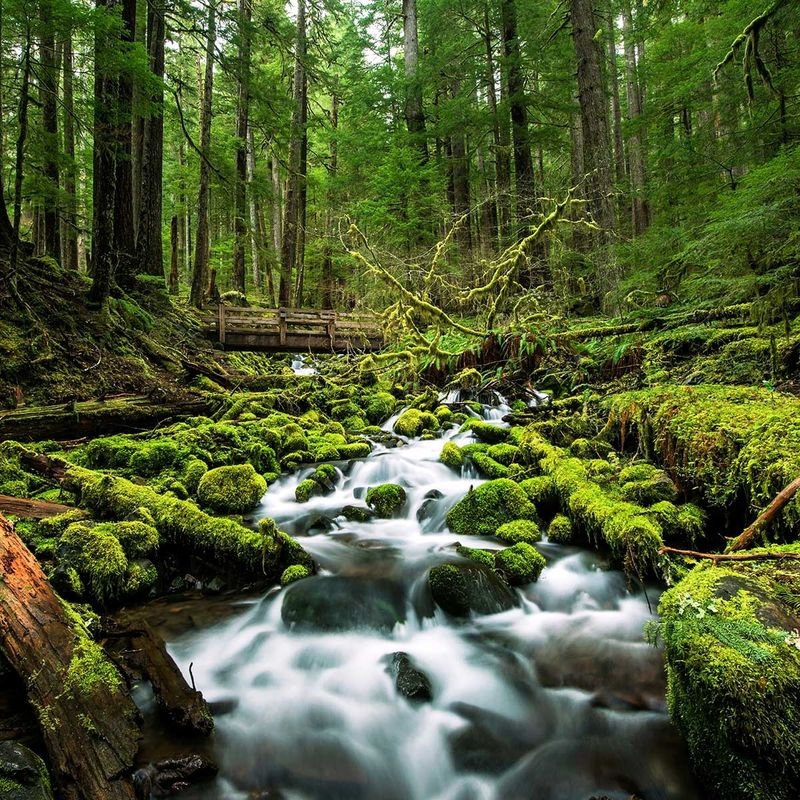

Resized Image:


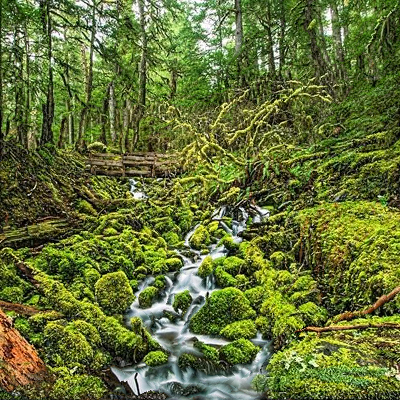

Vertical Seams Visualization:


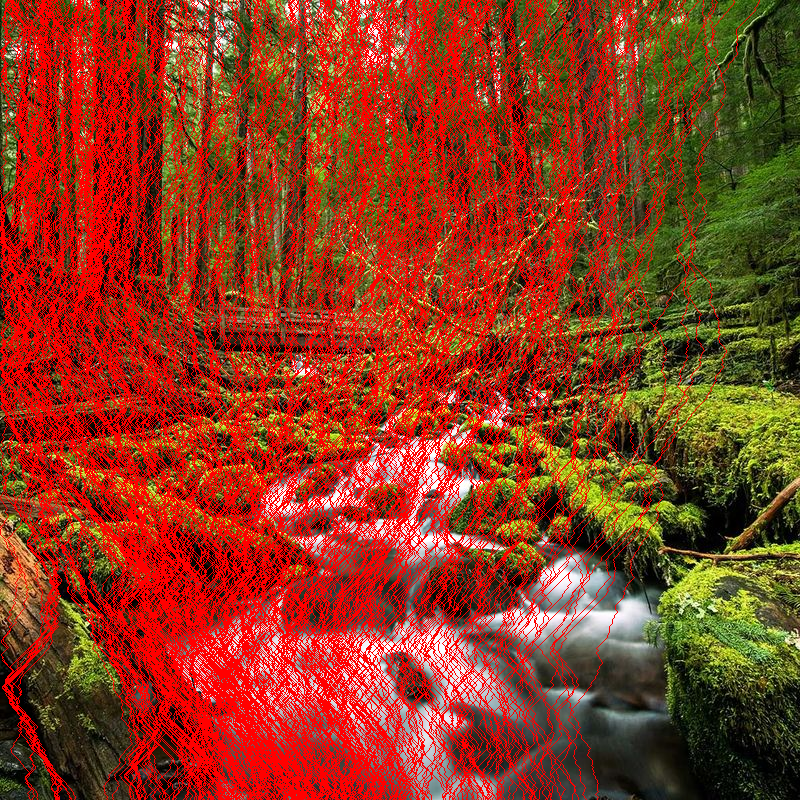

Horizontal Seams Visualization:


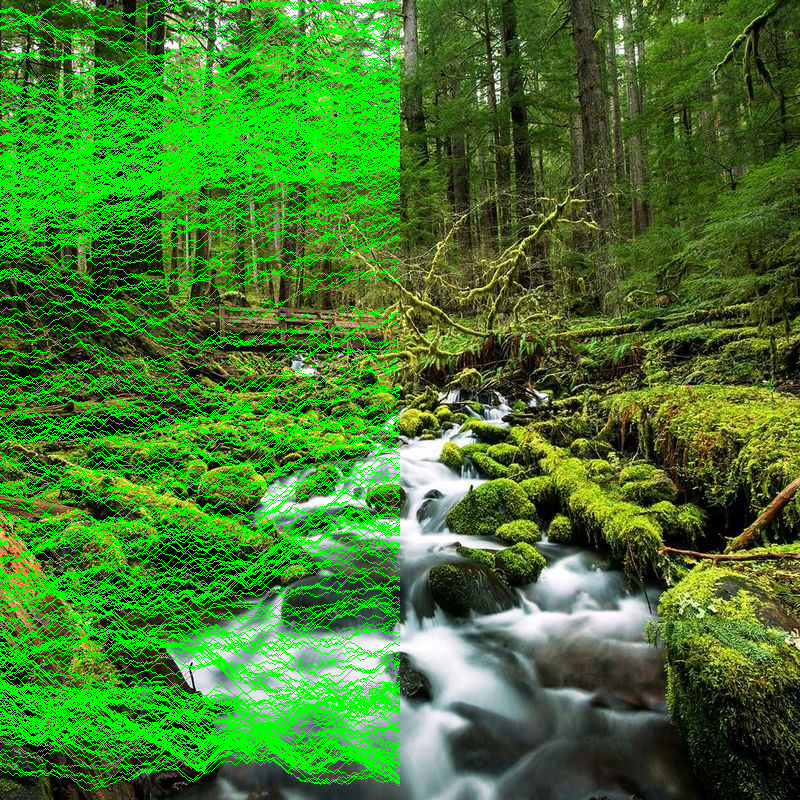

Combined Seams Visualization:


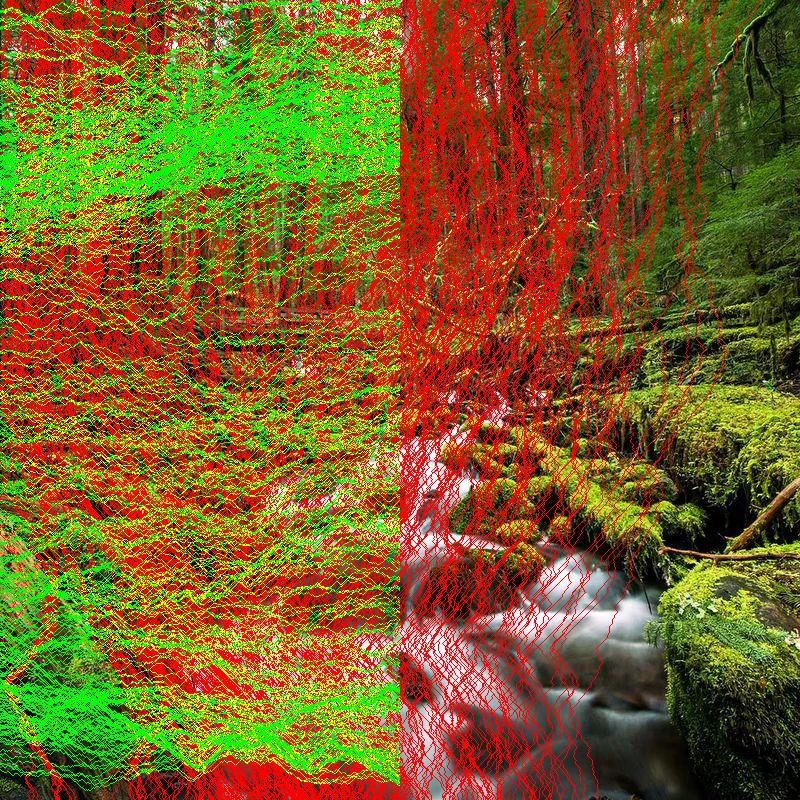

In [64]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time
from google.colab.patches import cv2_imshow

def calculate_energy(img):
    """
    Calculate energy using e1 = |∂/∂x I| + |∂/∂y I|
    Implemented manually but vectorized for speed
    """
    # Convert to float32 for better numerical precision
    img = img.astype(np.float32)
    height, width, channels = img.shape
    energy = np.zeros((height, width), dtype=np.float32)

    # Calculate x gradient using vectorized operations
    # Handle left edge
    dx_left = np.abs(img[0:height, 1:2, :] - img[0:height, 0:1, :])
    # Handle right edge
    dx_right = np.abs(img[0:height, width-1:width, :] - img[0:height, width-2:width-1, :])
    # Handle middle pixels
    dx_middle = np.abs(img[0:height, 2:width, :] - img[0:height, 0:width-2, :]) / 2

    # Combine gradients
    dx = np.zeros_like(img)
    dx[:, 0, :] = dx_left[:, 0, :]
    dx[:, width-1, :] = dx_right[:, 0, :]
    dx[:, 1:width-1, :] = dx_middle

    # Calculate y gradient using vectorized operations
    # Handle top edge
    dy_top = np.abs(img[1:2, 0:width, :] - img[0:1, 0:width, :])
    # Handle bottom edge
    dy_bottom = np.abs(img[height-1:height, 0:width, :] - img[height-2:height-1, 0:width, :])
    # Handle middle pixels
    dy_middle = np.abs(img[2:height, 0:width, :] - img[0:height-2, 0:width, :]) / 2

    # Combine gradients
    dy = np.zeros_like(img)
    dy[0, :, :] = dy_top[0, :, :]
    dy[height-1, :, :] = dy_bottom[0, :, :]
    dy[1:height-1, :, :] = dy_middle

    # Sum over color channels and combine x and y gradients
    energy = np.sum(np.abs(dx), axis=2) + np.sum(np.abs(dy), axis=2)

    return energy

def find_vertical_seam(energy):
    """
    Find the optimal vertical seam using dynamic programming with numpy operations
    """
    height, width = energy.shape

    # Initialize cumulative energy map with first row of energy
    cumulative = np.copy(energy)
    backtrack = np.zeros((height, width), dtype=np.int32)

    # For each row, calculate cumulative energy
    for i in range(1, height):
        # For each pixel in the row
        for j in range(width):
            # Handle edge cases
            if j == 0:
                # Can only go down or down-right
                min_idx = np.argmin([cumulative[i-1, j], cumulative[i-1, j+1]])
                backtrack[i, j] = j + min_idx
                cumulative[i, j] += cumulative[i-1, j + min_idx]
            elif j == width-1:
                # Can only go down or down-left
                min_idx = np.argmin([cumulative[i-1, j-1], cumulative[i-1, j]])
                backtrack[i, j] = j + min_idx - 1
                cumulative[i, j] += cumulative[i-1, j + min_idx - 1]
            else:
                # Can go down-left, down, or down-right
                min_idx = np.argmin([cumulative[i-1, j-1], cumulative[i-1, j], cumulative[i-1, j+1]])
                backtrack[i, j] = j + min_idx - 1
                cumulative[i, j] += cumulative[i-1, j + min_idx - 1]

    # Find the minimum energy path
    seam = np.zeros(height, dtype=np.int32)
    seam[-1] = np.argmin(cumulative[-1, :])

    # Backtrack to find the path
    for i in range(height-2, -1, -1):
        seam[i] = backtrack[i+1, seam[i+1]]

    return seam

def find_horizontal_seam(energy):
    """
    Find the optimal horizontal seam using dynamic programming
    """
    height, width = energy.shape
    # Transpose the energy map to reuse the vertical seam logic
    transposed_energy = energy.T
    seam = find_vertical_seam(transposed_energy)

    # Make sure the seam has the correct length (width of original image)
    # This is critical for visualization
    if len(seam) < width:
        # Extend the seam to cover the full width if needed
        extended_seam = np.zeros(width, dtype=np.int32)
        extended_seam[:len(seam)] = seam
        # For any remaining positions, use the last valid value
        if len(seam) > 0:
            extended_seam[len(seam):] = seam[-1]
        seam = extended_seam

    return seam

def remove_vertical_seam(img, seam):
    """
    Remove a vertical seam from the image using efficient numpy operations
    """
    height, width, channels = img.shape
    output = np.zeros((height, width-1, channels), dtype=img.dtype)

    # Create a mask to remove the seam
    mask = np.ones((height, width), dtype=bool)
    for i in range(height):
        mask[i, seam[i]] = False

    # Reshape the mask to match the image dimensions
    mask = np.stack([mask] * channels, axis=2)

    # Use the mask to copy the pixels
    output = img[mask].reshape(height, width-1, channels)

    return output

def remove_horizontal_seam(img, seam):
    """
    Remove a horizontal seam from the image using efficient numpy operations
    """
    # Transpose, remove vertical seam, then transpose back
    transposed = np.transpose(img, (1, 0, 2))
    result_transposed = remove_vertical_seam(transposed, seam)
    result = np.transpose(result_transposed, (1, 0, 2))

    return result

def visualize_seams(original_img, vertical_seams=None, horizontal_seams=None):
    """
    Create separate visualizations for horizontal and vertical seams
    """
    # Create copies for visualization
    vertical_vis = original_img.copy() if vertical_seams is not None else None
    horizontal_vis = original_img.copy() if horizontal_seams is not None else None
    combined_vis = original_img.copy()

    height, width = original_img.shape[:2]

    # Mark vertical seams in red
    if vertical_seams is not None:
        for seam in vertical_seams:
            for i in range(min(len(seam), height)):
                if 0 <= seam[i] < width:  # Safety check
                    vertical_vis[i, seam[i]] = [0, 0, 255]  # Red in BGR
                    combined_vis[i, seam[i]] = [0, 0, 255]  # Red in BGR

    # Mark horizontal seams in green - using the exact approach from the reference code
    if horizontal_seams is not None:
        for seam in horizontal_seams:
            for j in range(width):  # Loop through entire width
                if j < len(seam) and 0 <= seam[j] < height:  # Safety check
                    horizontal_vis[seam[j], j] = [0, 255, 0]  # Green in BGR

                    # Handle intersection with vertical seams
                    if np.array_equal(combined_vis[seam[j], j], [0, 0, 255]):
                        # If already marked as vertical seam, make it yellow
                        combined_vis[seam[j], j] = [0, 255, 255]  # Yellow in BGR
                    else:
                        combined_vis[seam[j], j] = [0, 255, 0]  # Green in BGR

    return vertical_vis, horizontal_vis, combined_vis

def seam_carving(img, new_width, new_height):
    """
    Resize image to new dimensions using seam carving with improved performance
    """
    height, width, _ = img.shape
    current_img = img.copy()

    # Keep track of removed seams for visualization
    vertical_seams = []
    horizontal_seams = []

    # Decide on removal strategy - we'll remove both in parallel
    v_seams_to_remove = width - new_width
    h_seams_to_remove = height - new_height

    print("Starting seam carving...")
    start_time = time.time()

    # Remove vertical seams first
    if v_seams_to_remove > 0:
        print(f"Removing {v_seams_to_remove} vertical seams...")
        progress_step = max(1, v_seams_to_remove // 10)

        for i in range(v_seams_to_remove):
            # Calculate energy
            energy = calculate_energy(current_img)

            # Find vertical seam
            seam = find_vertical_seam(energy)
            vertical_seams.append(seam)

            # Remove seam
            current_img = remove_vertical_seam(current_img, seam)

            if (i + 1) % progress_step == 0 or i == v_seams_to_remove - 1:
                progress = (i + 1) / v_seams_to_remove * 100
                print(f"Vertical seams: {i+1}/{v_seams_to_remove} ({progress:.1f}%)")

    # Remove horizontal seams
    if h_seams_to_remove > 0:
        print(f"Removing {h_seams_to_remove} horizontal seams...")
        progress_step = max(1, h_seams_to_remove // 10)

        for i in range(h_seams_to_remove):
            # Calculate energy
            energy = calculate_energy(current_img)

            # Find horizontal seam
            seam = find_horizontal_seam(energy)
            horizontal_seams.append(seam)

            # Remove seam
            current_img = remove_horizontal_seam(current_img, seam)

            if (i + 1) % progress_step == 0 or i == h_seams_to_remove - 1:
                progress = (i + 1) / h_seams_to_remove * 100
                print(f"Horizontal seams: {i+1}/{h_seams_to_remove} ({progress:.1f}%)")

    end_time = time.time()
    print(f"Seam carving completed in {end_time - start_time:.2f} seconds.")

    # Create visualizations
    vertical_vis, horizontal_vis, combined_vis = visualize_seams(img, vertical_seams, horizontal_seams)

    return current_img, vertical_vis, horizontal_vis, combined_vis

def main():
    filename = "/content/WhatsApp Image 2025-03-15 at 9.57.32 PM.jpeg"

    # Read image with OpenCV
    img = cv2.imread(filename)

    if img is None:
        print("Error loading image!")
        return

    # Get original dimensions
    height, width, _ = img.shape
    print(f"Original dimensions: {width}x{height}")

    # Calculate target dimensions (half of original)
    new_width = width // 2
    new_height = height // 2
    print(f"Target dimensions: {new_width}x{new_height}")

    # Apply seam carving
    resized_img, vertical_vis, horizontal_vis, combined_vis = seam_carving(img, new_width, new_height)

    # Save results (for Google Colab, first show them)
    print("Original Image:")
    cv2_imshow(img)

    print("Resized Image:")
    cv2_imshow(resized_img)

    print("Vertical Seams Visualization:")
    cv2_imshow(vertical_vis)

    print("Horizontal Seams Visualization:")
    cv2_imshow(horizontal_vis)

    print("Combined Seams Visualization:")
    cv2_imshow(combined_vis)

    # Save the images to files
    cv2.imwrite("resized_image.jpg", resized_img)
    cv2.imwrite("vertical_seams.jpg", vertical_vis)
    cv2.imwrite("horizontal_seams.jpg", horizontal_vis)
    cv2.imwrite("combined_seams.jpg", combined_vis)

if __name__ == "__main__":
    main()